In [132]:
import pandas as pd
df = pd.read_csv(r"C:\Users\hmina\OneDrive\デスクトップ\tarantula\practice\Lesson3\train.csv")
df

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,0,1203,0,0.680981,1,1,1,23,0.402580,117,...,1331,721,1970,15,1,4,1,0,1,2
1,3,1203,1,2.602754,1,0,0,8,0.415612,194,...,1571,1262,1150,14,16,14,1,0,1,3
2,4,1980,1,2.604065,1,0,0,6,0.858110,122,...,364,721,1970,18,12,11,1,0,1,1
3,5,1185,1,2.669403,1,3,0,33,0.027065,132,...,447,1162,1950,15,3,19,1,0,0,2
4,7,1203,1,2.375453,0,4,1,12,0.141485,135,...,364,1917,1970,16,7,6,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,1994,710,0,1.827054,0,0,1,61,0.139117,199,...,788,1023,3269,12,4,2,1,1,1,1
1196,1995,965,1,0.498963,0,6,0,32,0.923505,103,...,813,721,1970,18,5,20,1,0,0,3
1197,1996,1949,0,0.470755,0,1,0,38,0.798602,134,...,115,1951,1598,18,3,17,0,0,0,1
1198,1997,1537,0,1.323370,0,1,1,4,0.122960,187,...,376,1692,3952,14,2,9,1,1,0,1


In [133]:
# 前処理
df.isnull().sum()

id               0
battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [148]:
for i in df.columns:
    print(f"{i}")

id
battery_power
blue
clock_speed
dual_sim
fc
four_g
int_memory
m_dep
mobile_wt
n_cores
pc
px_height
px_width
ram
sc_h
sc_w
talk_time
three_g
touch_screen
wifi
price_range


In [134]:
# y: "price_range", X: それ以外のカラム
X = df.drop('price_range',axis=1)
X = X.drop('id',axis=1)
y = df['price_range']

In [135]:
# 相関関係
corr_matrix = df.corr()
corr_matrix["price_range"]

id               0.010506
battery_power    0.034393
blue            -0.087965
clock_speed     -0.191862
dual_sim         0.114032
fc              -0.003688
four_g           0.098793
int_memory       0.051820
m_dep           -0.008338
mobile_wt       -0.053276
n_cores         -0.126218
pc               0.039364
px_height       -0.039832
px_width         0.033333
ram             -0.153472
sc_h            -0.045995
sc_w            -0.047693
talk_time       -0.042415
three_g          0.070085
touch_screen    -0.099301
wifi            -0.025522
price_range      1.000000
Name: price_range, dtype: float64

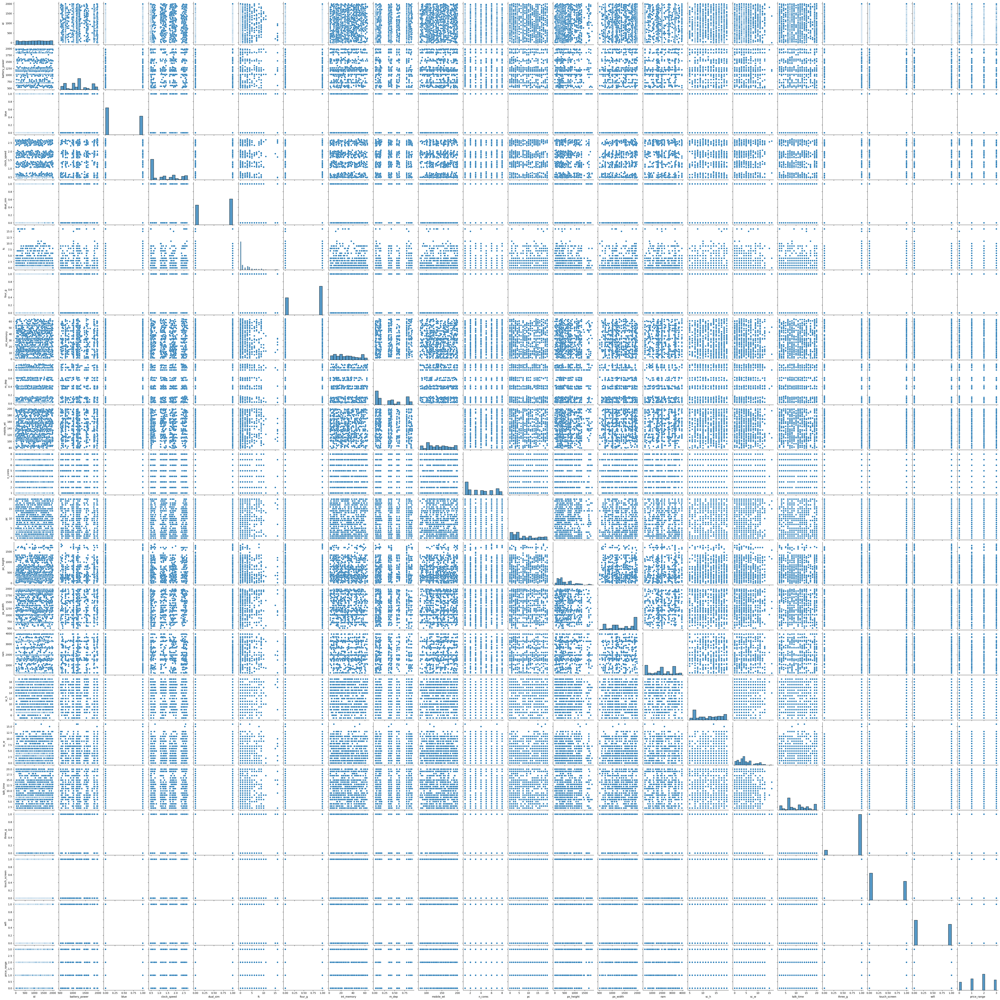

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.pairplot(df)
plt.show()

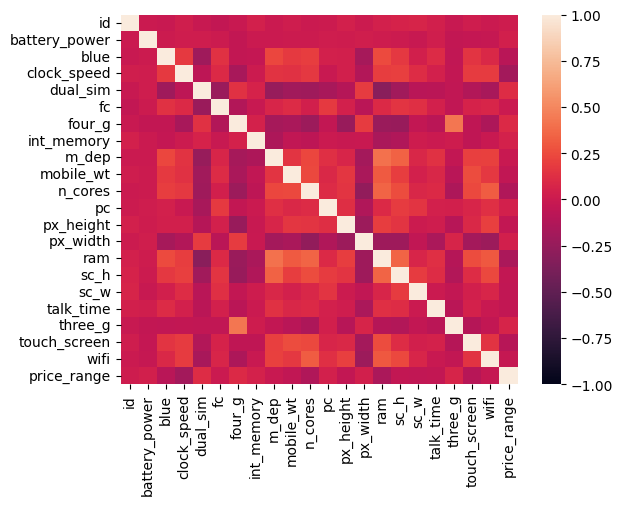

In [137]:
# ヒートマップ
sns.heatmap(corr_matrix, vmin=-1, vmax=1)
plt.show()

# MEMO
'dual_sim', 'px_width', 'four_g'が他の変数との相関関係がやや強そう（特に'ram'と'dual_sim'）だが，総じてあまり高くない

In [138]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=0)

In [139]:
# 決定木，ランダムフォレスト，XGBoostに対応したClass Optuna
import optuna
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

class HyperparameterTuner:
    def __init__(self, algorithm):
        self.algorithm = algorithm

    def objective(self, trial):
        if self.algorithm == 'DecisionTree':
            params = {
                'max_depth': trial.suggest_int('max_depth', 2, 10),
                'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
                'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
                'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2']),
            }
            model = DecisionTreeClassifier(**params)

        elif self.algorithm == 'RandomForest':
            params = {
                'n_estimators': trial.suggest_int('n_estimators', 10, 100),
                'max_depth': trial.suggest_int('max_depth', 2, 10),
                'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
                'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
                'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2']),
            }
            model = RandomForestClassifier(**params)

        elif self.algorithm == 'XGBoost':
            params = {
                'objective': 'binary:logistic',
                'eval_metric': 'logloss',
                'booster': 'gbtree',
                'verbosity': 0,
                'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
                'max_depth': trial.suggest_int('max_depth', 3, 10),
                'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
                'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0),
                'alpha': trial.suggest_loguniform('alpha', 1e-5, 10.0),
                'lambda': trial.suggest_loguniform('lambda', 1e-5, 10.0),
            }
            model = xgb.XGBClassifier(**params)

        model.fit(X_train, y_train)
        accuracy = model.score(X_valid, y_valid)
        return accuracy

    def optimize(self, X_train, y_train, X_valid, y_valid, n_trials=100):
        study = optuna.create_study(direction='maximize')
        study.optimize(self.objective, n_trials=n_trials)
        return study.best_params

In [140]:
# 混同行列
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
def calc_cm(model, X_test, y_test):
    y_pred = model.predict(X_test)
    cm = pd.DataFrame(confusion_matrix(y_test, model.predict(X_test).reshape(-1,1))) #TODO: reshapeとは？
    print(f"混同行列\n{cm}") # 行：実際，列：予想

    # accuracy
    print(f"accuracy_score:{accuracy_score(y_test, y_pred)}")
    print(f"precision_score:{precision_score(y_test, y_pred, average='micro')}")
    print(f"recall_score:{recall_score(y_test, y_pred, average='micro')}")
    print(f"f1score:{f1_score(y_test, y_pred, average='micro')}")

[I 2024-05-07 19:19:06,064] A new study created in memory with name: no-name-b863dba1-8925-4f2b-bd95-a8c93ac8b8e4
[I 2024-05-07 19:19:06,069] Trial 0 finished with value: 0.4427083333333333 and parameters: {'max_depth': 3, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2'}. Best is trial 0 with value: 0.4427083333333333.
[I 2024-05-07 19:19:06,077] Trial 1 finished with value: 0.453125 and parameters: {'max_depth': 7, 'min_samples_split': 5, 'min_samples_leaf': 18, 'max_features': None}. Best is trial 1 with value: 0.453125.
[I 2024-05-07 19:19:06,083] Trial 2 finished with value: 0.4479166666666667 and parameters: {'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 14, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.453125.
[I 2024-05-07 19:19:06,088] Trial 3 finished with value: 0.4427083333333333 and parameters: {'max_depth': 3, 'min_samples_split': 3, 'min_samples_leaf': 8, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.453125.
[I 2024-05

Best parameters for DecisionTree: {'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 14, 'max_features': 'sqrt'}


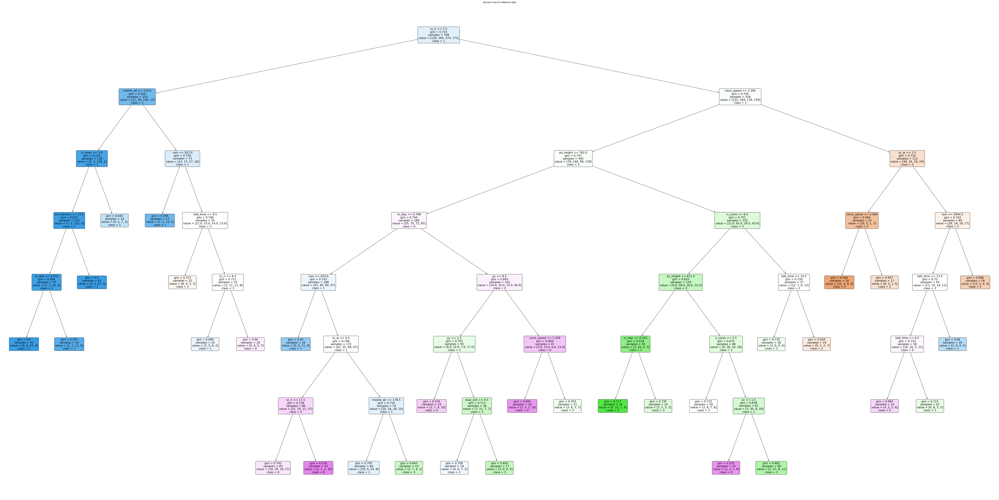

混同行列
    0   1   2   3
0  10   9   7  11
1   5  19  20  23
2  10  14  51   4
3   6  20  13  18
accuracy_score:0.4083333333333333
precision_score:0.4083333333333333
recall_score:0.4083333333333333
f1score:0.4083333333333333


In [141]:
# 決定木
# ハイパラチューニング
from sklearn import tree

dt_tuner = HyperparameterTuner('DecisionTree')
best_params_dt = dt_tuner.optimize(X_train, y_train, X_valid, y_valid)
print("Best parameters for DecisionTree:", best_params_dt)

dt_model = DecisionTreeClassifier(**best_params_dt)
dt_model.fit(X_train, y_train)

# 決定木の描画と画像の作成
plt.figure(figsize=(100,50))
tree.plot_tree(dt_model, feature_names = X.columns, class_names = y.unique().astype(str), filled = True, rounded = True)
plt.title(f'decision tree of cellphone data')
plt.savefig(f'tree_of_cellphone_data.png')
plt.show()

calc_cm(dt_model, X_test, y_test)

In [142]:
import numpy as np

[I 2024-05-07 19:19:13,381] A new study created in memory with name: no-name-a70dbd55-e2d7-496b-8412-e71461e6aa88
[I 2024-05-07 19:19:13,496] Trial 0 finished with value: 0.4427083333333333 and parameters: {'n_estimators': 76, 'max_depth': 2, 'min_samples_split': 16, 'min_samples_leaf': 5, 'max_features': None}. Best is trial 0 with value: 0.4427083333333333.
[I 2024-05-07 19:19:13,522] Trial 1 finished with value: 0.453125 and parameters: {'n_estimators': 19, 'max_depth': 5, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.453125.
[I 2024-05-07 19:19:13,619] Trial 2 finished with value: 0.4739583333333333 and parameters: {'n_estimators': 41, 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 15, 'max_features': None}. Best is trial 2 with value: 0.4739583333333333.
[I 2024-05-07 19:19:13,672] Trial 3 finished with value: 0.4791666666666667 and parameters: {'n_estimators': 42, 'max_depth': 7, 'min_samples_split': 14, 'min_s

Best parameters for RandomForest: {'n_estimators': 34, 'max_depth': 7, 'min_samples_split': 11, 'min_samples_leaf': 7, 'max_features': 'sqrt'}
混同行列
   0   1   2   3
0  9  18   3   7
1  7  41   7  12
2  7  17  46   9
3  4  35   2  16
accuracy_score:0.4666666666666667
precision_score:0.4666666666666667
recall_score:0.4666666666666667
f1score:0.4666666666666667


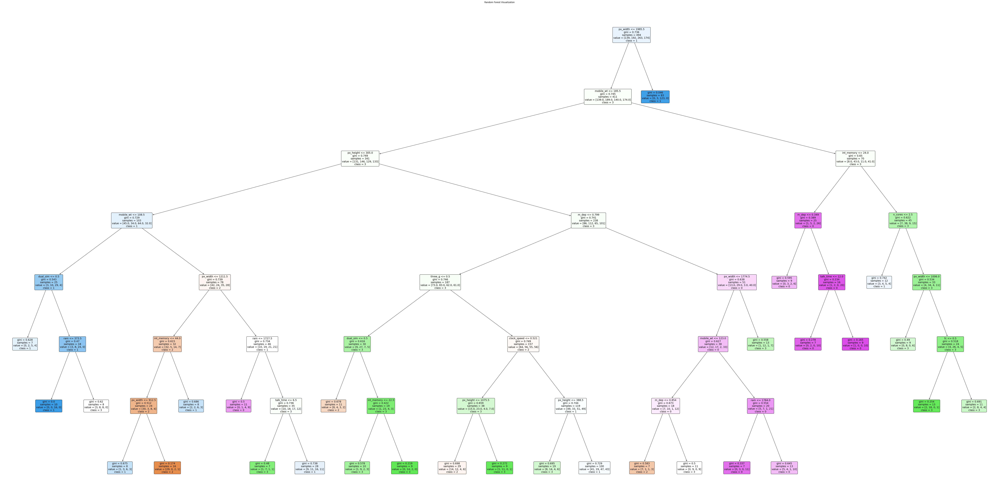

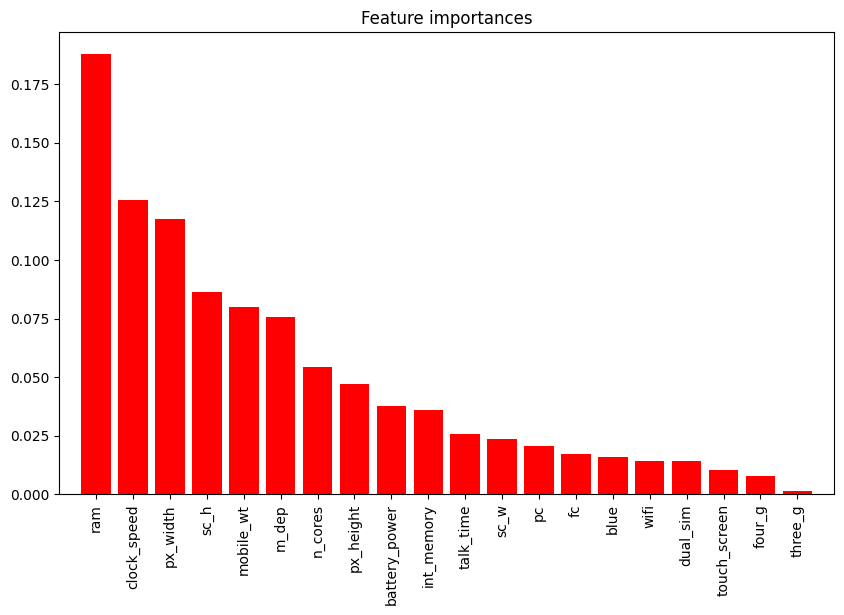

In [143]:
# Random Forest
# ハイパラチューニング
rf_tuner = HyperparameterTuner('RandomForest')
best_params_rf = rf_tuner.optimize(X_train, y_train, X_valid, y_valid)
print("Best parameters for RandomForest:", best_params_rf)

rf_model = RandomForestClassifier(**best_params_rf)
rf_model.fit(X_train, y_train)

calc_cm(rf_model, X_test, y_test)

# ランダムフォレストから1つの決定木を取得
estimator = rf_model.estimators_[0]

# 決定木の描画
plt.figure(figsize=(100,50))
tree.plot_tree(estimator, feature_names=X.columns, class_names=y.unique().astype(str), filled=True, rounded=True)
plt.title('Random Forest Visualization')
plt.savefig(f'random_forest_of_cellphone_data.png')
plt.show()

# ランダムフォレストから特徴の重要度を取得
importances = rf_model.feature_importances_

# 特徴の重要度を降順でソート
indices = np.argsort(importances)[::-1]

# 特徴の重要度の可視化
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], color="r", align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

In [150]:
calc_cm(rf_model, X_test, y_test)

混同行列
   0   1   2   3
0  9  18   3   7
1  7  41   7  12
2  7  17  46   9
3  4  35   2  16
accuracy_score:0.4666666666666667
precision_score:0.4666666666666667
recall_score:0.4666666666666667
f1score:0.4666666666666667


In [144]:
from graphviz import Source
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin/'

# XGBoost
# ハイパラチューニング
xgb_tuner = HyperparameterTuner('XGBoost')
best_params_xgb = xgb_tuner.optimize(X_train, y_train, X_valid, y_valid)
print("Best parameters for XGBoost:", best_params_xgb)

xgb_model = xgb.XGBClassifier(**best_params_xgb)
xgb_model.fit(X_train, y_train)

calc_cm(xgb_model, X_test, y_test)

[I 2024-05-07 19:19:27,562] A new study created in memory with name: no-name-7b9d1f1a-5df7-4df6-836a-13eb8cd6ca43
C:\Users\hmina\AppData\Local\Temp\ipykernel_31136\4097303710.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\hmina\AppData\Local\Temp\ipykernel_31136\4097303710.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
C:\Users\hmina\AppData\Local\Temp\ipykernel_31136\4097303710.py:40: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0

Best parameters for XGBoost: {'learning_rate': 0.0656439870466242, 'max_depth': 9, 'subsample': 0.649065842491813, 'colsample_bytree': 0.7828361262961095, 'alpha': 0.001005376971985034, 'lambda': 0.11672409772994989}
混同行列
    0   1   2   3
0  13  14   3   7
1  11  32  13  11
2   6   9  54  10
3   4  25   7  21
accuracy_score:0.5
precision_score:0.5
recall_score:0.5
f1score:0.5


ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH

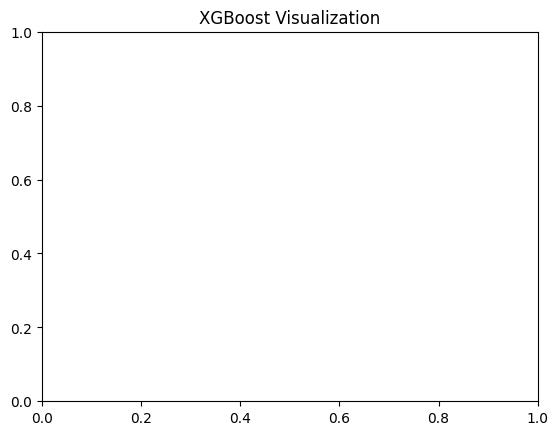

In [78]:
# XGBoostモデルから最初の決定木を取得

#xgb.plot_tree(xgb_model, num_trees=0)
#plt.rcParams['figure.figsize'] = [50, 10]
#plt.show()

# XGBoostモデルから最初の決定木を取得
plt.title('XGBoost Visualization')
plot_data = xgb.to_graphviz(xgb_model, num_trees=0)
plot_data.render('xgb_tree', format='png', cleanup=True)  # グラフをPNG形式で保存
plot_data.show()

# 特徴量の重要度を取得
importance = xgb_model.feature_importances_

# 特徴量の重要度を降順でソート
sorted_idx = np.argsort(importance)

# 特徴量の重要度を可視化
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')
plt.show()

In [151]:
X.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'],
      dtype='object')

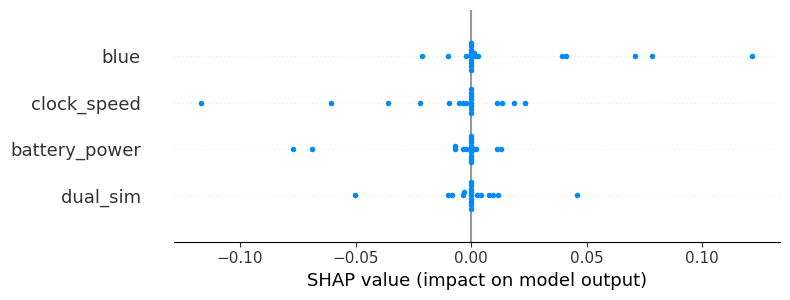

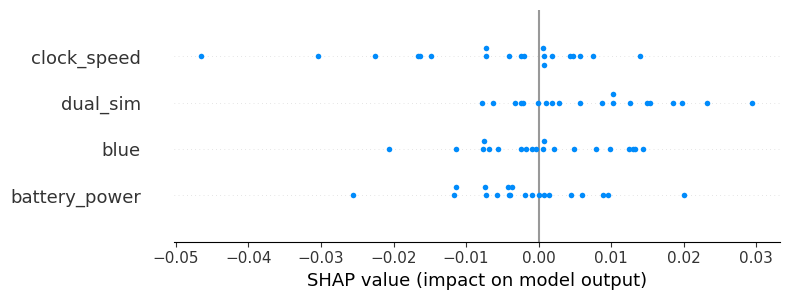

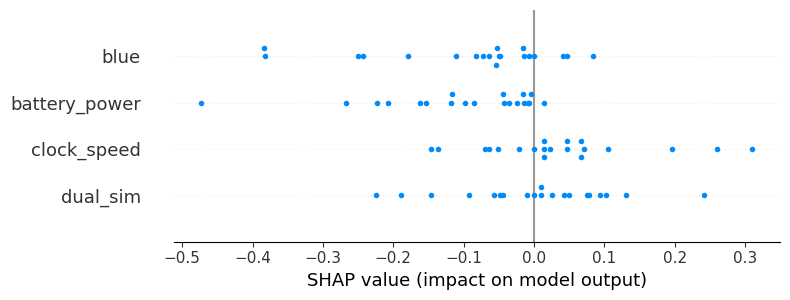

In [152]:
# 結果の考察（SHAP図など）
import shap
# shap.initjs()

dt_explainer = shap.TreeExplainer(dt_model)
rf_explainer = shap.TreeExplainer(rf_model)
xgb_explainer = shap.TreeExplainer(xgb_model)

dt_shap_values = dt_explainer.shap_values(X)
shap.summary_plot(dt_shap_values[0], feature_names=X.columns)

rf_shap_values = rf_explainer.shap_values(X)
shap.summary_plot(rf_shap_values[0], feature_names=X.columns)

xgb_shap_values = xgb_explainer.shap_values(X)
shap.summary_plot(xgb_shap_values[0], feature_names=X.columns)


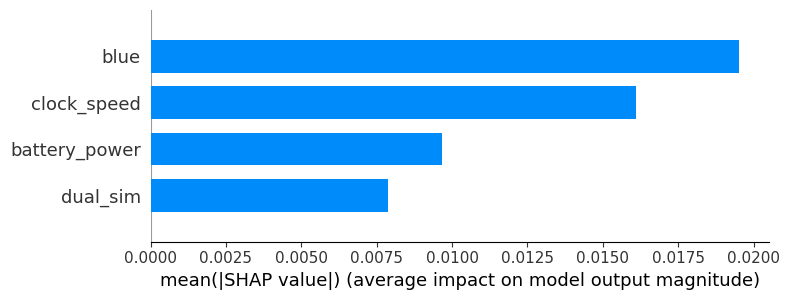

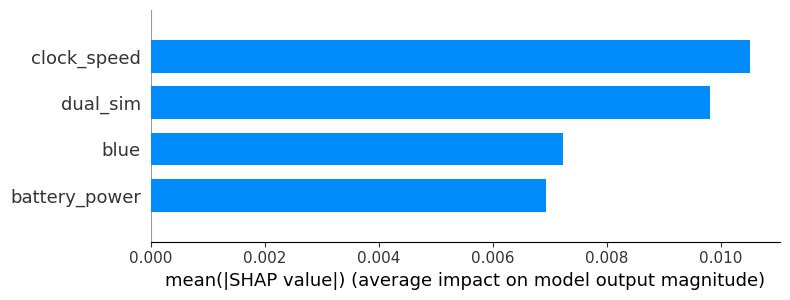

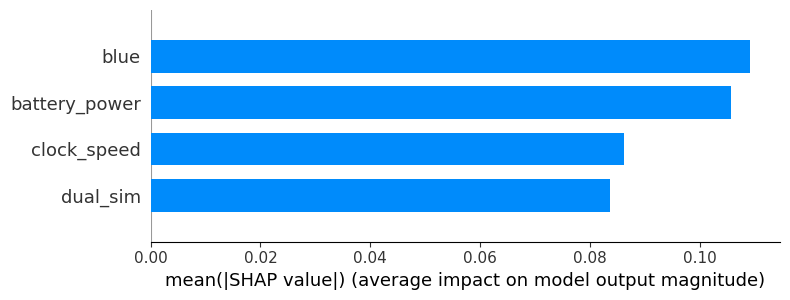

In [146]:
dt_shap_values = dt_explainer.shap_values(X)
shap.summary_plot(dt_shap_values[0], feature_names=X.columns, plot_type="bar")

rf_shap_values = rf_explainer.shap_values(X)
shap.summary_plot(rf_shap_values[0], feature_names=X.columns, plot_type="bar")

xgb_shap_values = xgb_explainer.shap_values(X)
shap.summary_plot(xgb_shap_values[0], feature_names=X.columns, plot_type="bar")

In [ ]:
# optuna(参考)
import optuna

class Objective:
    def __init__(self, X, y):
        self.X = X
        self.y = y
    
    def __call__(self, trial):
        params = {
            # 最適化アルゴリズムを指定
            'solver' : trial.suggest_categorical('solver',['newton-cg','lbfgs','sag','saga']),
            # 正則化の強さを指定
            'C': trial.suggest_loguniform('C', 0.001, 10),
            # 最大反復回数
            'max_iter' : trial.suggest_int('max_iter', 100, 100000)
        }
        model = LogisticRegression(**params)
        
        # 損失関数はクロスバリデーション，評価指標として正解率の最大化を目指す
        scores = cross_validate(model,
                                X=self.X,
                                y=self.y,
                                scoring='accuracy', # 正解率を指定
                                n_jobs=-1 #並行して実行するジョブの数（-1はすべてのプロセッサを使用）
                                )
        
        return scores['test_score'].mean()